In [1]:
%load_ext autoreload
%autoreload 2
import os
import os.path as osp
import numpy as np
from PIL import Image
import cv2
import sys
np.set_printoptions(threshold=sys.maxsize)
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg
from scipy.stats import norm
from scipy import stats
from PIL import Image
from urllib.request import Request, urlopen
from tqdm.notebook import tqdm
import json
%reload_ext autoreload

## You have an option to run evaluation and use the model or just view the results of it. If you want to use the model  make sure you have pytorch installed and uncomment code in few cells below.

In [2]:
import test

# Model
For my model I choose the most popular algorithm that I could find on the first Google page. 
It's face-parsing.PyTorch by zllrunning.  
Link: https://github.com/zllrunning/face-parsing.PyTorch  
It has ~1000 stars and ~200 forks. It is a bit outdated as the last commit is from 2 years ago. 
It segment parts of the person in 19 categories(nose, mouth, left eye, hair, clothes, background, etc.), but I changed the code slightly to classify face parts as one class 'face' and the rest as 'background'. 

# Training DataSet
Not only the model, but also the DataSet that it was trained on is crucial. Pre trained model used in this analysis was trained on 'CelebAMask-HQ dataset'. 
Dataset contains 30k images of celebrities.
Few important things I noticed in that set:  
    - All images are the same size 1024x1024, but training size was 512x512  
    - Practically all images have the eyes of a person in the same places  
      (if you scroll through images, eyes don't change location)  
    - Face in majority of images makes ~30%-40% of the whole image  
    - Faces are usually faced forward or slightly tilted  
### - IMPORTANT: It has massive underrepresentation of old people(70+) ~ 2-3% of entire Dataset

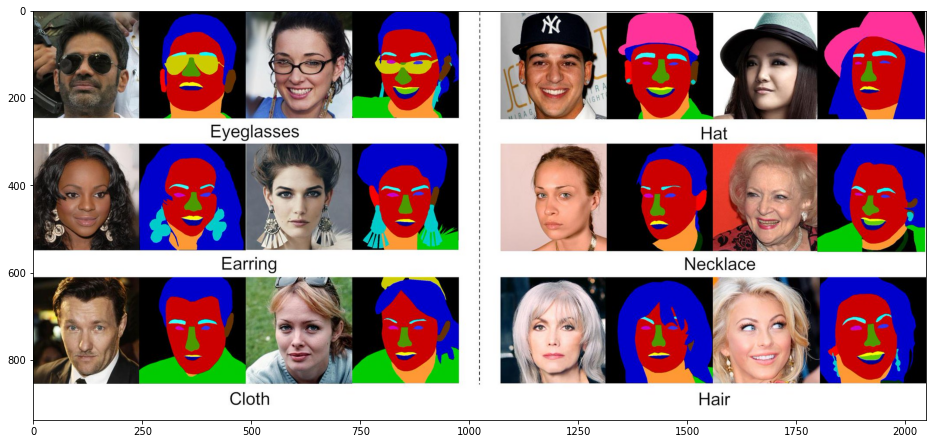

In [3]:
plt.figure(figsize = (16, 8))
img = cv2.imread('CelebAMask-HQ.png')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

# Here we run the evaluation on different input sizes, you can run it to, but you don't have to, because all the results are saved in json files.

In [4]:
# for size_input in tqdm(range(256, 1048, 32)): 
#     ious, pois, excessive_parts, not_found_parts, resolutions = test.evaluate(size = size_input)
#     ratios = [res[0]/res[1] for res in resolutions]
#     sizes = []
#     for res in resolutions:
#         if res[0] >= size_input:
#             width = 1 
#         else:
#             width = res[0]/size_input
#         if res[1] >= size_input:
#             height = 1 
#         else:
#             height = res[1]/size_input
#         sizes.append(width*height)
#     data = [ious, pois, excessive_parts, not_found_parts, resolutions, ratios, sizes]
#     with open('size_results_jsons/size_{}.json'.format(size_input), 'w', encoding='utf-8') as f:
#         json.dump(data, f, ensure_ascii=False, indent=4)

# Input sizes and IoU plot shows us that we have maximum value of IoU on size ~600-800. Obviously the higher the resolution the slower the segmentation. We will stick with 512 through the rest on this notebook, but you can change it if you want.

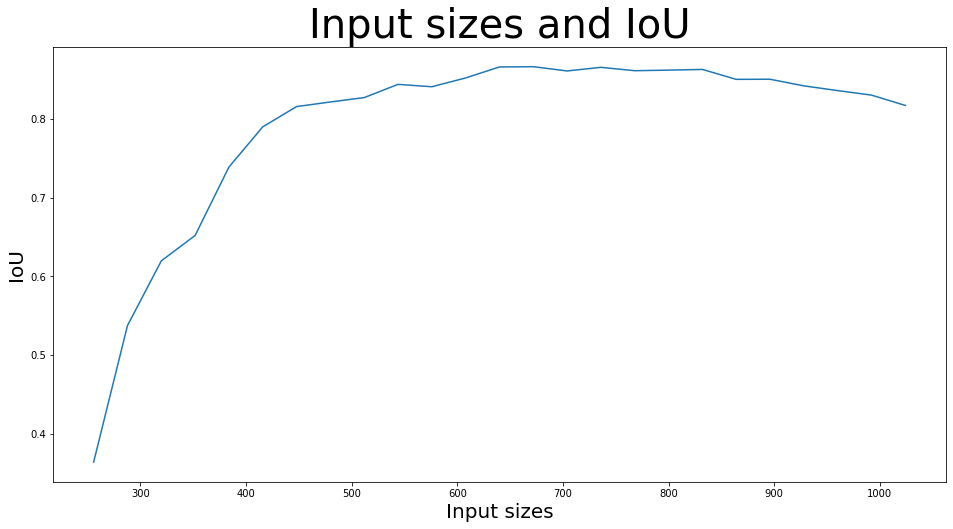

In [5]:
ious_sizes = []
for size_input in range(256, 1048, 32): 
    with open('size_results_jsons/size_{}.json'.format(size_input)) as f:
        data = json.load(f)
        ious_size = data[0]
        iou_mean = sum(ious_size)/len(ious_size)
        ious_sizes.append(iou_mean)
plt.figure(figsize=(16, 8))
plt.title('Input sizes and IoU', fontsize=40)
plt.xlabel('Input sizes', fontsize=20)
plt.ylabel('IoU', fontsize=20)
plt.plot(range(256, 1048, 32), ious_sizes)

# Run evaluation of the model on one input size on Old People Dataset
It saves 30 segmented images in 'res/test_res' folder.

In [6]:
# size_input = 512
# ious, pois, excessive_parts, not_found_parts, resolutions = test.evaluate(size = size_input)
# ratios = [res[0]/res[1] for res in resolutions]
# sizes = []
# for res in resolutions:
#     if res[0] >= size_input:
#         width = 1 
#     else:
#         width = res[0]/size_input
#     if res[1] >= size_input:
#         height = 1 
#     else:
#         height = res[1]/size_input
#     sizes.append(width*height)

# Load results of evaluation of the model at certain input size on Old People Dataset

In [7]:
size_input = 512
with open('size_results_jsons/size_{}.json'.format(size_input)) as f:
    data = json.load(f)
ious = data[0]
pois = data[1]
excessive_parts = data[2]
not_found_parts = data[3]
resolutions = data[4]
ratios = data[5]
sizes = data[6]

# Aliases
PARTS OF IMAGE (PoI) - Part of the entire image that contains a face, so mask/resolution.  
NOT FOUND PARTS (NFP) - parts of the face that should be segmented but weren't.  
EXCESSIVE PARTS (EP) - parts that were segmented, but shouldn't be.  
RATIOS - Width/Height of an image.    
SIZES - Complicated one. Input image to the net is lets say 512x512, and so were all the training images, because even the larger one got resized.   
I wanted to see how much 'resolution' we got COMPARED to that 512x512.  
So if dimension >= 512, than we had dimension size set to 1.  
If dimension < 512, than we had dimension size set to dimension/512.
In next step we multiply dimension sizes (height * width) to get full size.  
Example: resolution (800x600), so 1 * 1 = size(1),  
resolution (256x128), so 256/512 * 128/512 = size(0.125),  
resolution (600x384), so 1 * 384/512 = size(0.75)  


# Visualization of Old People DataSet and segmentations
On the right, we see the image that was fed into the network (size 512x512). With IoU and PoI metrics.   
On the left, we see the original unchanged image.   
GREEN represents NOT FOUND PARTS (NFP).   
RED represents EXCESSIVE PARTS (EP).  
YELLOW-ISH color represents correctly segmented parts.

<ipython-input-8-fdbf30061914>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16, 8))


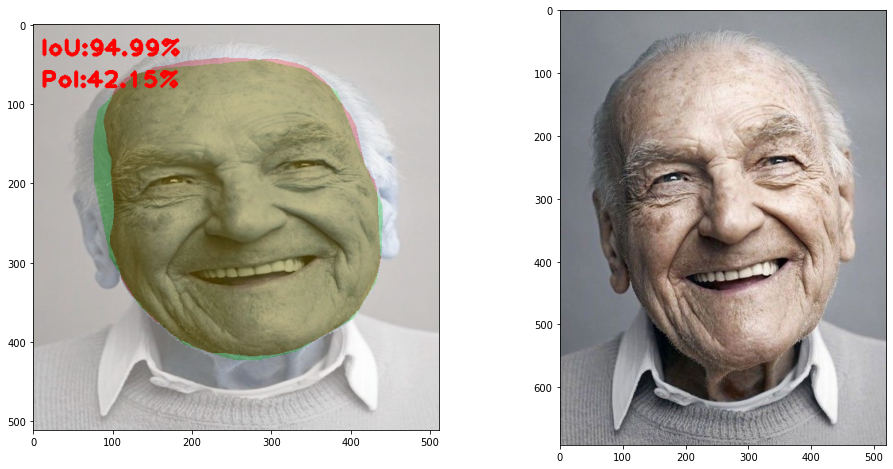

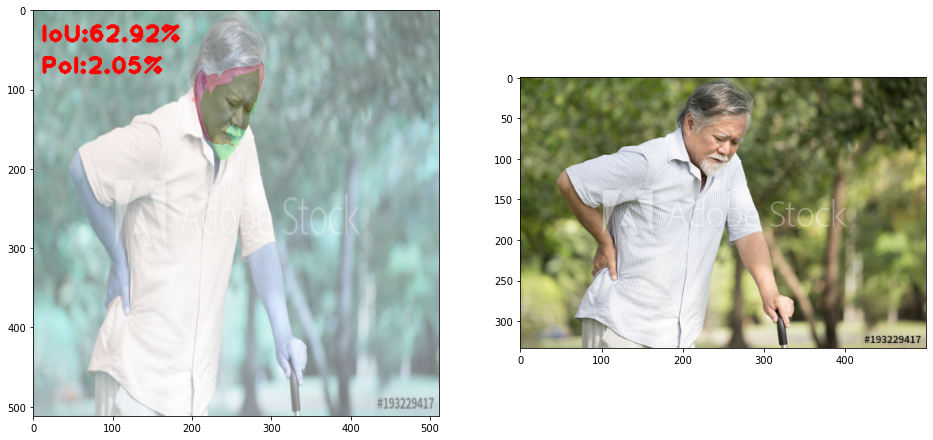

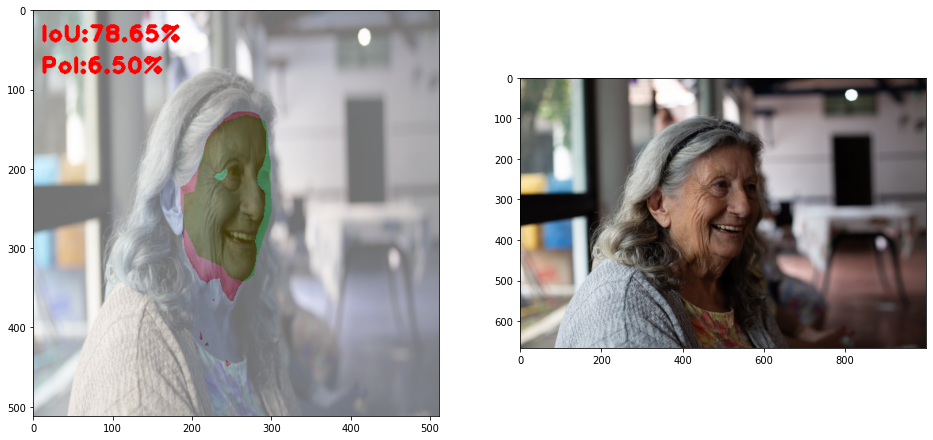

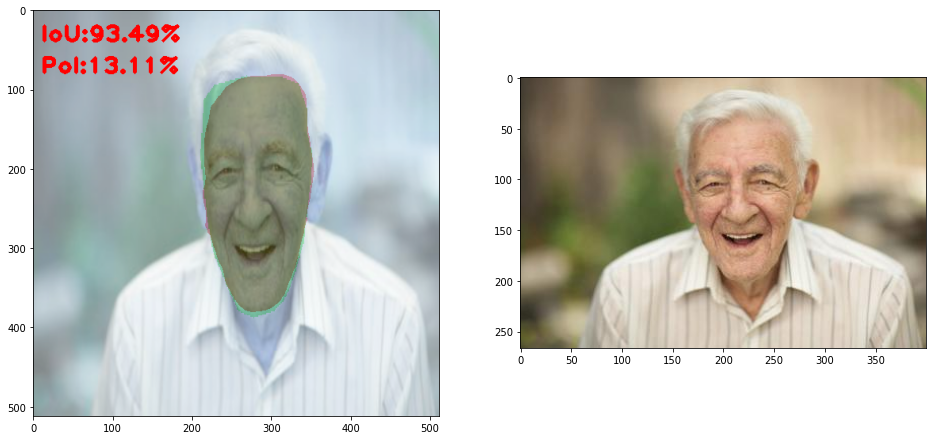

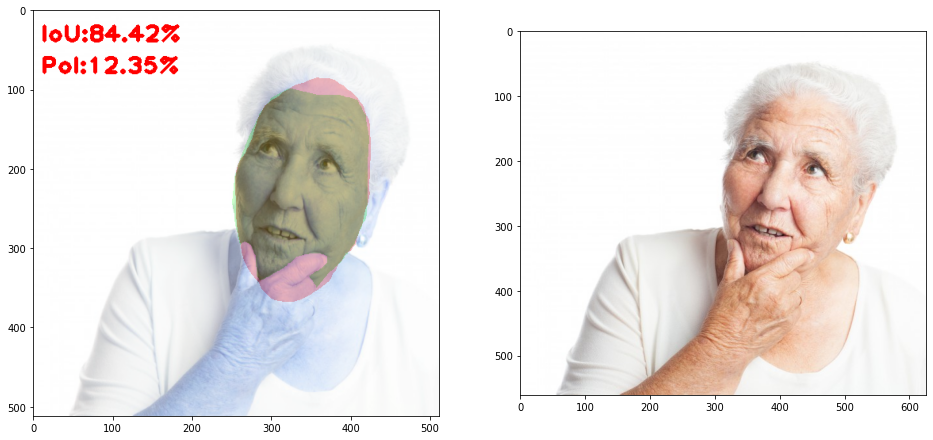

...

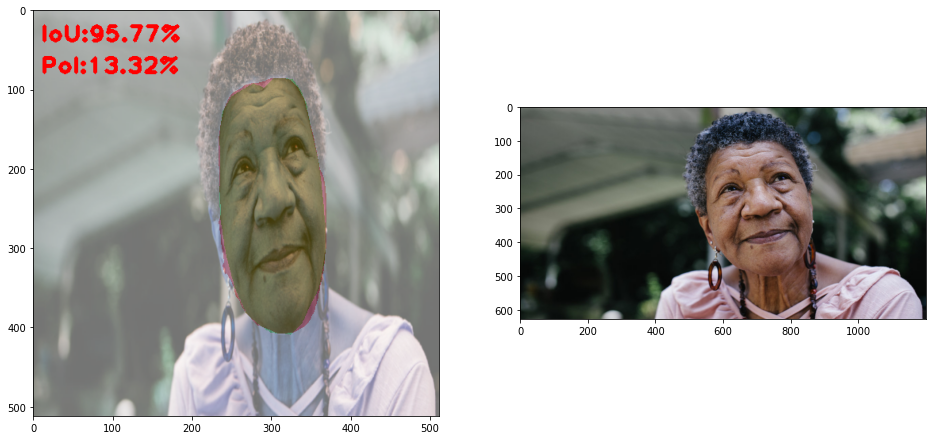

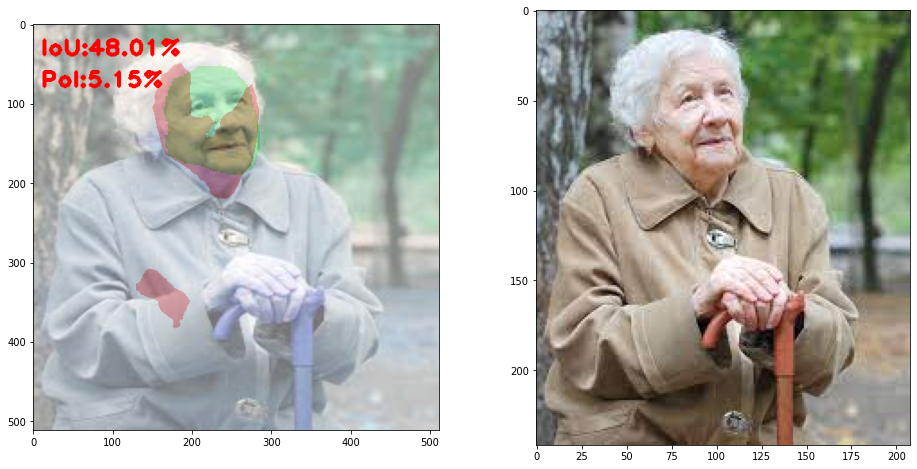

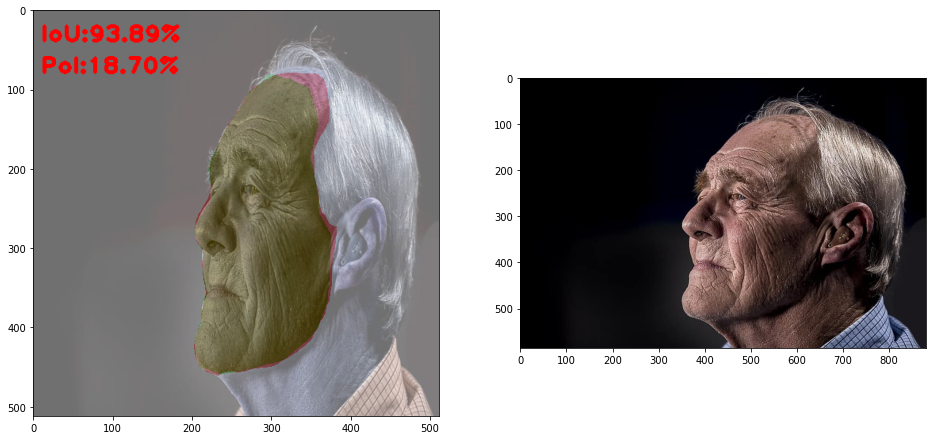

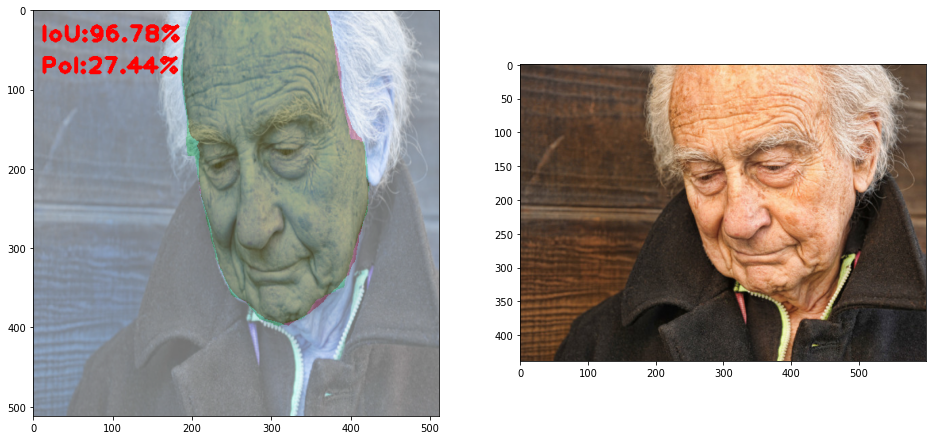

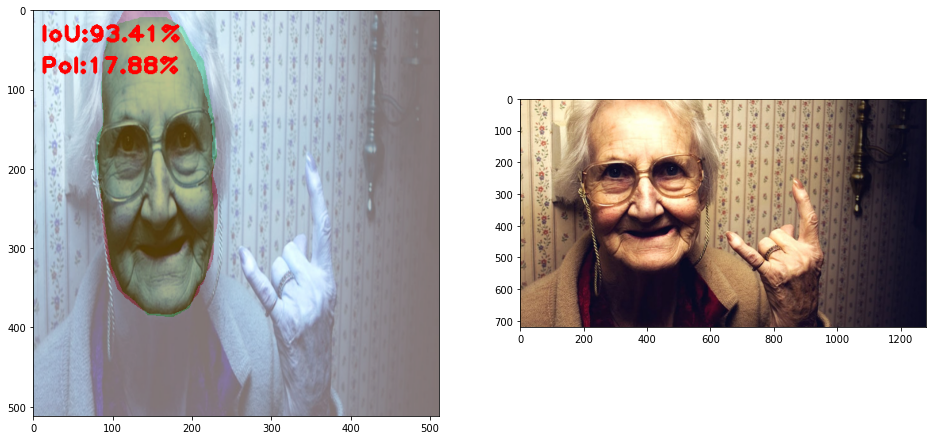

In [8]:
folder_results_path = 'res/test_res/' 
folder_raw_path = 'old_people/'
for image_path in os.listdir(folder_results_path):
    plt.figure(figsize=(16, 8))
    img = cv2.imread(folder_results_path + image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(121)
    plt.imshow(img)
    img = cv2.imread(folder_raw_path + image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(122)
    plt.imshow(img)

# Visualization on the image from the web. Just pass the link to it. Pytorch required.

Image processed successfully. Resolution (450, 600).


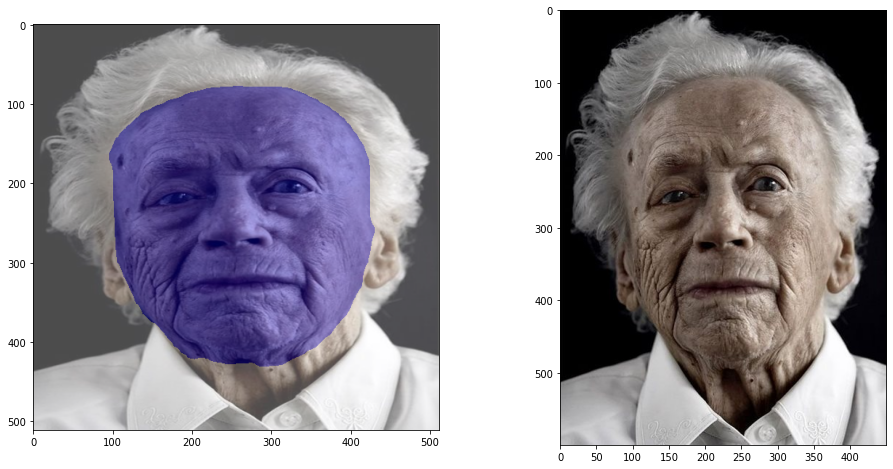

In [3]:
url_to_img = '''
https://technotoday.com.tr/wp-content/uploads/eski/i/c/00009293-4979.jpg
'''
req = Request(url_to_img, headers={'User-Agent': 'Mozilla/5.0'})
req = urlopen(req).read()
arr = np.asarray(bytearray(req), dtype=np.uint8)
img = cv2.imdecode(arr, -1)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = Image.fromarray(img)
vis_img = test.segment(img, size=512)
plt.figure(figsize=(16, 8))
vis_img = cv2.cvtColor(vis_img, cv2.COLOR_BGR2RGB)
plt.subplot(121)
plt.imshow(vis_img)
plt.subplot(122)
plt.imshow(img)

In [10]:
def distribution(data, step, title, x_title, y_title, sample_size=30):
    mu, std = norm.fit(data)
    print("Fit results(black): mu = %.4f,  std = %.4f." % (mu, std))
    std_population = std/((sample_size+1)**0.5)
    print("""From central limit theorem we can draw distribution(red) of possible mean of the population
based on {} item sample. Population mean={:.3f}, population std {:.3f}.""".format(sample_size, mu , std_population))

    plt.figure(figsize=(10,5))
    plt.hist(data, bins=np.arange(min(data), max(data) + step, step),
            density=True, alpha=0.6, color='g')
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=5)
    p = norm.pdf(x, mu, std_population)
    plt.plot(x, p, 'r', linewidth=3)
    title = title
    plt.title(title, fontsize=40)
    plt.xlabel(x_title, fontsize=20)
    plt.ylabel(y_title, fontsize=20)
    plt.show()

Fit results(black): mu = 0.8272,  std = 0.1746.
From central limit theorem we can draw distribution(red) of possible mean of the population
based on 30 item sample. Population mean=0.827, population std 0.031.


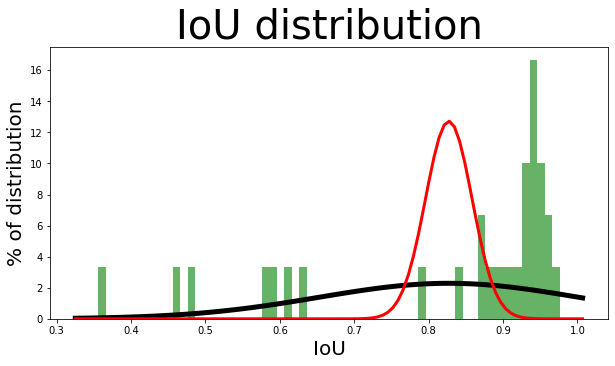

In [11]:
distribution(ious, 0.01, "IoU distribution", 'IoU', '% of distribution')

Fit results(black): mu = 0.1686,  std = 0.1026.
From central limit theorem we can draw distribution(red) of possible mean of the population
based on 30 item sample. Population mean=0.169, population std 0.018.


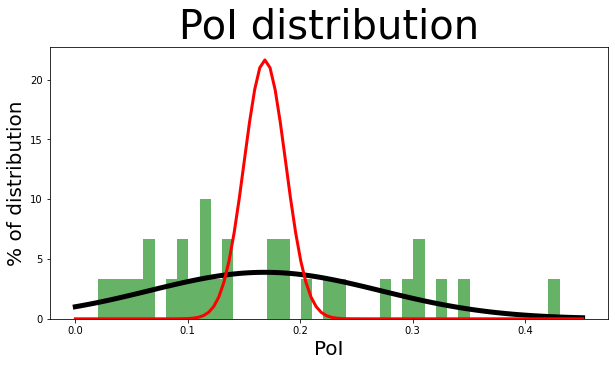

In [12]:
distribution(pois, 0.01, "PoI distribution", 'PoI', '% of distribution')

Fit results(black): mu = 0.1044,  std = 0.1244.
From central limit theorem we can draw distribution(red) of possible mean of the population
based on 30 item sample. Population mean=0.104, population std 0.022.


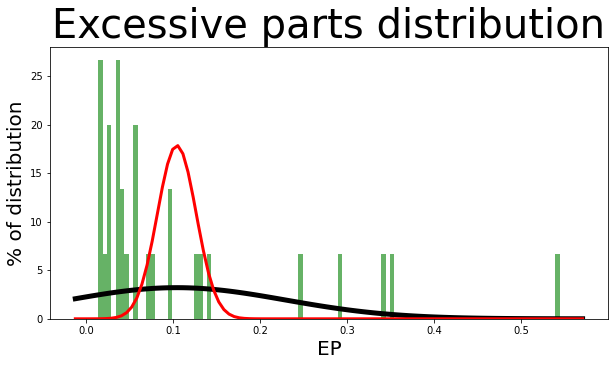

In [13]:
distribution(excessive_parts, 0.005, "Excessive parts distribution", 'EP', '% of distribution')

Fit results(black): mu = 0.0684,  std = 0.1157.
From central limit theorem we can draw distribution(red) of possible mean of the population
based on 30 item sample. Population mean=0.068, population std 0.021.


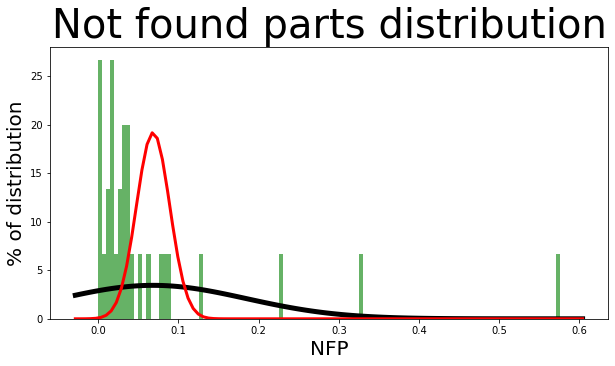

In [14]:
distribution(not_found_parts, 0.005, "Not found parts distribution", 'NFP', '% of distribution')

Fit results(black): mu = 1.4178,  std = 0.3717.
From central limit theorem we can draw distribution(red) of possible mean of the population
based on 30 item sample. Population mean=1.418, population std 0.067.


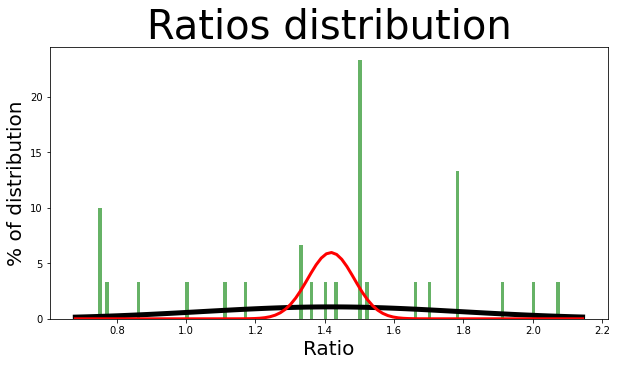

In [15]:
distribution(ratios, 0.01, "Ratios distribution", 'Ratio', '% of distribution')

Fit results(black): mu = 0.7728,  std = 0.2795.
From central limit theorem we can draw distribution(red) of possible mean of the population
based on 30 item sample. Population mean=0.773, population std 0.050.


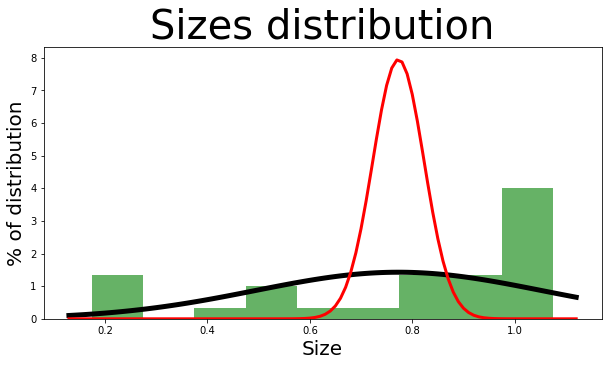

In [16]:
distribution(sizes, 0.1, "Sizes distribution", 'Size', '% of distribution')

In [17]:
def plot_dependencies(data1, data2, data1_name, data2_name):
    corr = stats.spearmanr(data1, data2)
    print('Spearman correlation {:.3f} with p-value {:.5f}'.format(corr[0], corr[1]))
    plt.figure(figsize=(10,5))
    plt.scatter(data1, data2, s=100)
    title = "{} and {} plot".format(data1_name, data2_name)
    plt.title(title, fontsize=40)
    plt.xlabel(data1_name, fontsize=20)
    plt.ylabel(data2_name, fontsize=20)
    plt.show()

### IoU and PoI plot
IoU an PoI plot show something interesting. We can clearly see that above a certain threshold(PoI >= 0.1) model has no problem with segmentation of the face.

In [18]:
mu_all, std_all = norm.fit(ious)
PoI_threshold = 0.1
mu_over, std_over = norm.fit([ious[idx] for idx in range(len(ious)) if pois[idx]>=PoI_threshold])
mu_below, std_below = norm.fit([ious[idx] for idx in range(len(ious)) if pois[idx]<PoI_threshold])
print("""From mean IoU of entire dataset equal to {:.3f},
we got mu={:.3f} for PoI >= {PoI}
and we got mu={:.3f} for PoI < {PoI}.""".format(mu_all, mu_over, mu_below, PoI=PoI_threshold))

From mean IoU of entire dataset equal to 0.827,
we got mu=0.924 for PoI >= 0.1
and we got mu=0.602 for PoI < 0.1.


Spearman correlation 0.687 with p-value 0.00003


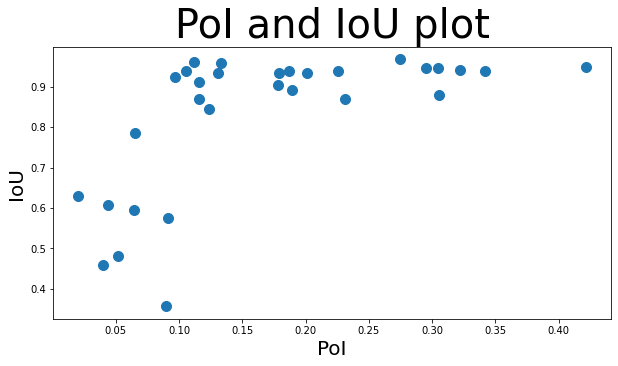

In [19]:
plot_dependencies(pois, ious, 'PoI', 'IoU')

### Ratio does not have any significant affect on IOU.

Spearman correlation -0.088 with p-value 0.64323


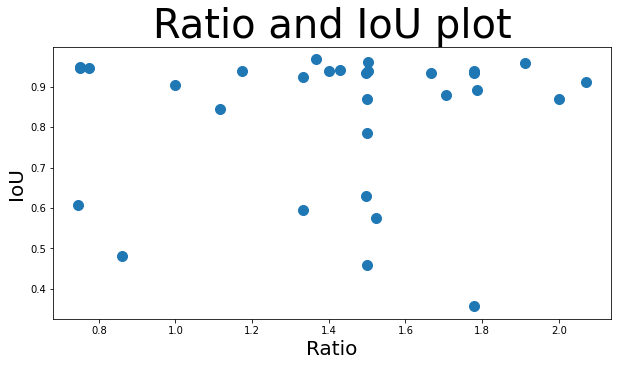

In [20]:
plot_dependencies(ratios, ious, 'Ratio', 'IoU')

In [21]:
mu_all, std_all = norm.fit(ious)
Sizes_threshold = 1
mu_over, std_over = norm.fit([ious[idx] for idx in range(len(ious)) if sizes[idx]>=Sizes_threshold])
mu_below, std_below = norm.fit([ious[idx] for idx in range(len(ious)) if sizes[idx]<Sizes_threshold])
print("""From mean IoU of entire dataset equal to {:.3f},
we got mu={:.3f} for Size = {size}
and we got mu={:.3f} for Size < {size}.""".format(mu_all, mu_over, mu_below, size=Sizes_threshold))

From mean IoU of entire dataset equal to 0.827,
we got mu=0.915 for Size = 1
and we got mu=0.776 for Size < 1.


Spearman correlation 0.173 with p-value 0.36143


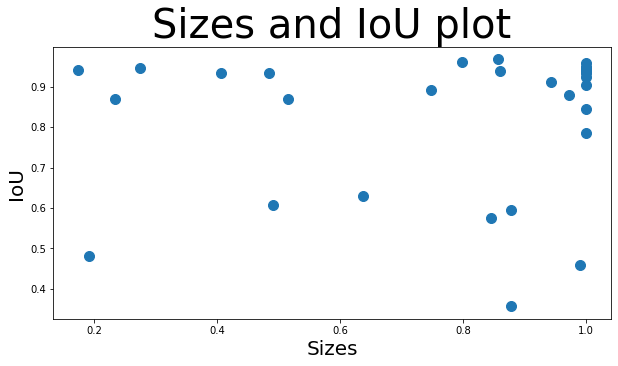

In [22]:
plot_dependencies(sizes, ious, 'Sizes', 'IoU')

### We got two parameters that have 'strong' correlation with IoU - Sizes and PoIs. As we can see below they are not correlated with each other, so we should think of them both while optimizing the model. 

Spearman correlation 0.055 with p-value 0.77107


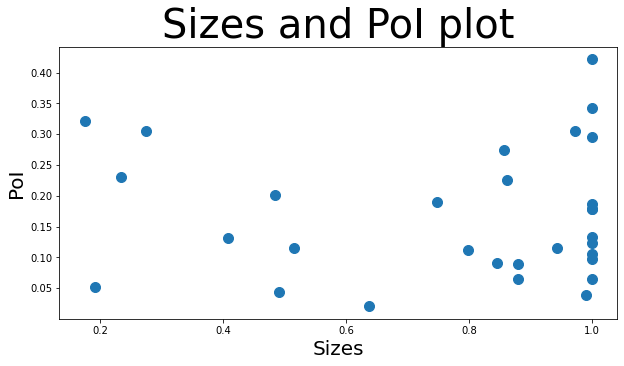

In [23]:
plot_dependencies(sizes, pois, 'Sizes', 'PoI')

# Visual inspection
70+ people visually differs significantly from 70- ones: big freckles, asymmetry , gray hair, loose skin, etc.
Wrong segmentation happens usually on the jaw line(loose skin) and the hair line(gray hair, baldness).
If we have image with PoI>0.1 and at least 512x512 resolution segmentation will be fine, doesn't really matter on an angle, age(70 or 90), face expression etc.

# Summary of a model
In general model works fine. We have to remember that in segmentation, we can not expect 100% IoU.  
Especially when we deal with something hard to describe and label. Face is one of those things, if someone has a weak a jaw, baldness, etc. we cannot precisely label a face, because we don't know where exactly it starts and ends. And between different people labeling the same image I presume that would be a ~95% IoU.
We also have to consider very small sample (30) of old people images. So the population can look different.

# Proposed experiments
Pretty obvious think to suggest would be to retrained model on training images that are more similar to the images that we want to use our model on. 
And i know my task was to find an improvement on segmenting faces of older people, but it is also important how the images of those old people would look like. What PoI, resolution, etc. they will have, not only if there's an old person in it. So if the images would be in small resolution and had small faces (PoI=5%) we would have to train our model on such training images.  
We could find a new dataset with older people or make one, it takes about a minute with labeling one image.  
We could use Celeb DataSet, if the PoI is not a problem, if the resolution is a problem we could train it on lower ones e.x. 224, 256, 320. But still we would have to lower the imbalances between 70+ and 70- classes. There are many ways to do it, in class/model parameters, or limit/augment certain classes.
We also could simply trained it on old people only(~1k images + optional augmentation).   
I would also try changing 19 classes into 2 - face and background in annotations, so the model would focus only on that while training.

We could also try to fine-tune hyper-parameters of a model: batch size, optimize parameters, etc. It would take a lot of time and computational power.  
To be honest, I don't know much about this model. It's poorly documented and reading into the code and figuring out how exactly it works and how can I make it better, would take me a lot of time. Nevertheless I think it is worth to do it, because last commit was made 2 years ago, so there probably are some new ways to enhance it. For example training it on different input sizes(416,512,608), not on fixed size(512), as I noticed it is right now.  
All of the ideas above are only ideas and we have to test them to see which one works.